In [1]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import torch
from tqdm.auto import tqdm
import time

import cv2
import pandas as pd 
import config as CFG
import torch.nn.functional as F
import matplotlib.pyplot as plt
from models import CLIPModel 
from modules import TextEncoder

import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from train import *

2023-12-08 09:13:40.984191: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-08 09:13:41.525901: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Text to Image

### Getting Image Embeddings

In [2]:
def get_image_embeddings(valid_df, model_path):
    text_encoder = TextEncoder()
    tokenizer = text_encoder.tokenizer

    valid_loader = build_loaders(valid_df, tokenizer, mode="valid")
    
    model = CLIPModel().to(CFG.device)
    model.load_state_dict(torch.load(model_path, map_location=CFG.device))
    model.eval()
    
    valid_image_embeddings = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            image_features = model.image_encoder(batch["image"].to(CFG.device))
            image_embeddings = model.image_projection(image_features)
            valid_image_embeddings.append(image_embeddings)
    return model, torch.cat(valid_image_embeddings)
    
_, valid_df = make_train_valid_dfs()
model, image_embeddings = get_image_embeddings(valid_df, "best.pt")

100%|██████████| 994/994 [01:13<00:00, 13.46it/s]


### Finding Matches

In [3]:
def find_matches_image(model, image_embeddings, query, image_filenames, n=9):
    text_encoder = TextEncoder()
    tokenizer = text_encoder.tokenizer
    encoded_query = tokenizer([query])
    batch = {
        key: torch.tensor(values).to(CFG.device)
        for key, values in encoded_query.items()
    }
    with torch.no_grad():
        text_features = model.text_encoder(batch)
        text_embeddings = model.text_projection(text_features)
        
    image_embeddings_n = F.normalize(image_embeddings, p=2, dim=-1)
    text_embeddings_n = F.normalize(text_embeddings, p=2, dim=-1)
    dot_similarity = text_embeddings_n @ image_embeddings_n.T
    
    _, indices = torch.topk(dot_similarity.squeeze(0), n * 5)
    matches = [image_filenames[idx] for idx in indices[::5]]
    
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    for match, ax in zip(matches, axes.flatten()):
        image = cv2.imread(f"{CFG.image_path}/{match}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.axis("off")
    
    fig.suptitle(query)
    plt.savefig(f'results/{time.time()}.jpg')
    plt.show()

### Results

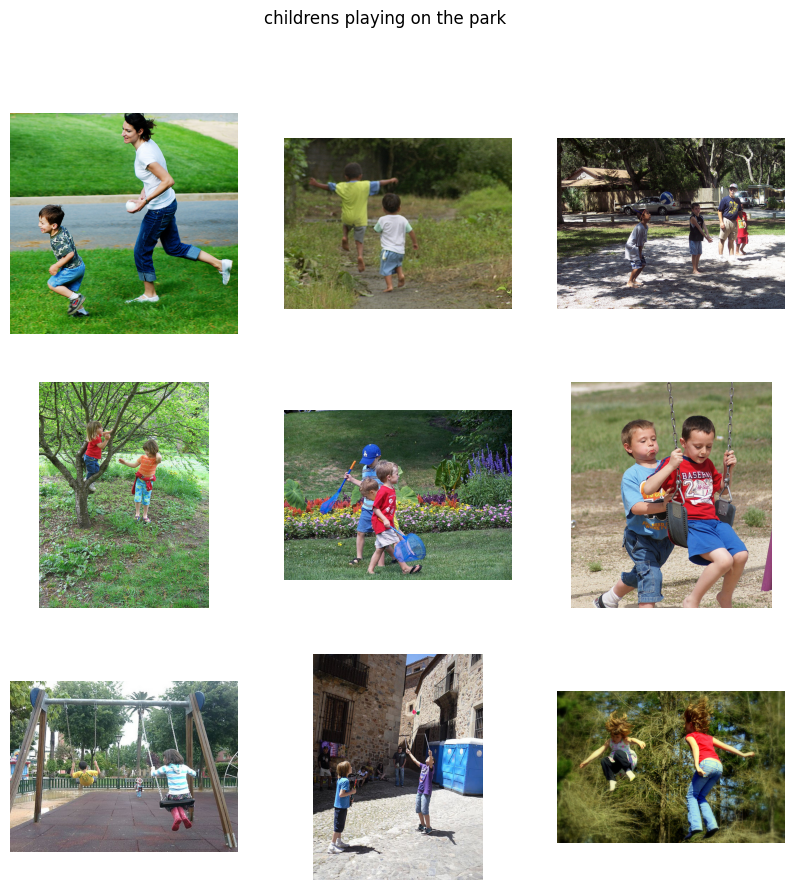

In [4]:
find_matches_image(model, 
             image_embeddings,
             query="childrens playing on the park",
             image_filenames=valid_df['image'].values,
             n=9)

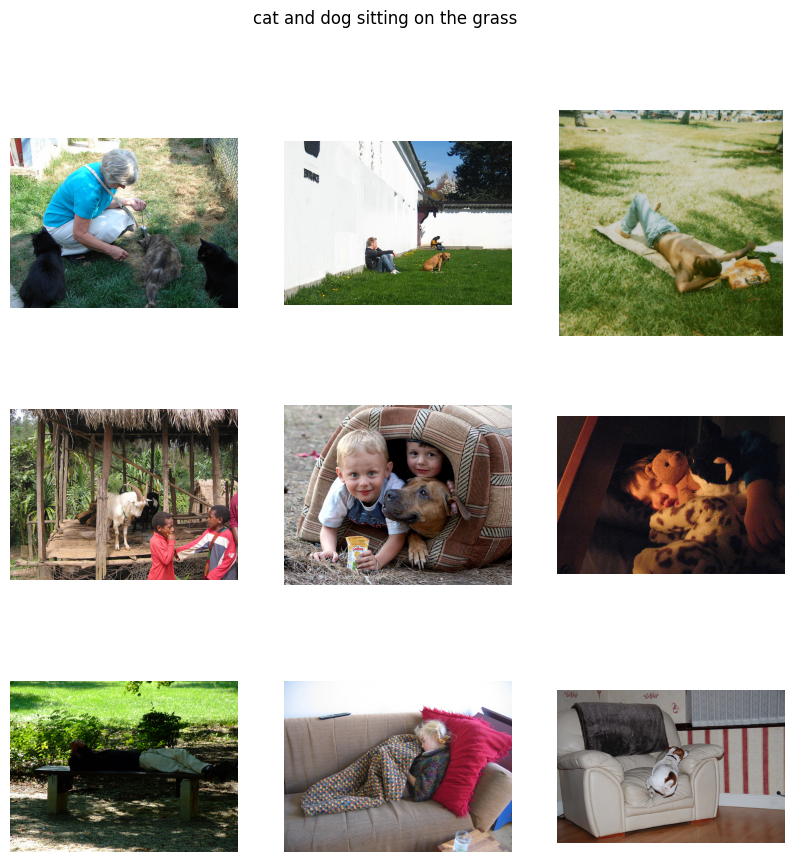

In [5]:
find_matches_image(model, 
             image_embeddings,
             query="cat and dog sitting on the grass",
             image_filenames=valid_df['image'].values,
             n=9)

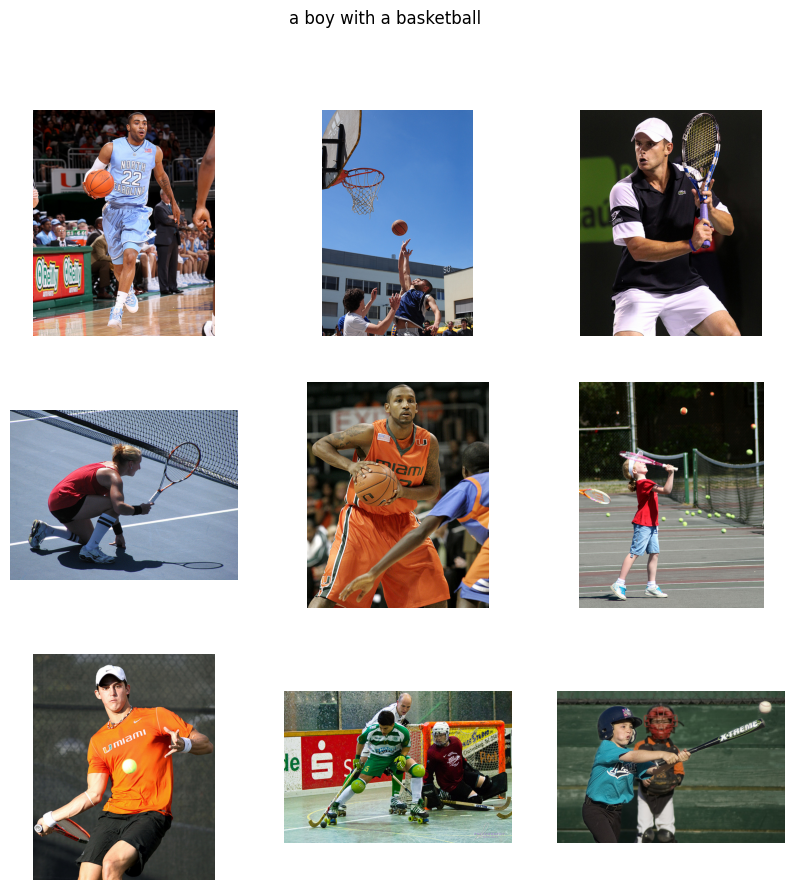

In [6]:
find_matches_image(model, 
             image_embeddings,
             query="a boy with a basketball",
             image_filenames=valid_df['image'].values,
             n=9)

## Image to Text

### Getting Text Embeddings

In [7]:
def get_text_embedding(valid_df, model_path):
    model = CLIPModel().to(CFG.device)
    model.load_state_dict(torch.load(model_path, map_location=CFG.device))
    model.eval()
    
    text_enc = TextEncoder()
    text_enc = text_enc.to(CFG.device)
    tokenizer = text_enc.get_tokenzier()
    
    valid_loader = build_loaders(valid_df, tokenizer, mode="valid")
    
    val_text_embedding = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            keys_to_keep = ['input_ids', 'token_type_ids', 'attention_mask']
            batch = {k: v.to(CFG.device) for k, v in batch.items() if k in keys_to_keep}  # Move batch to device
            text_features = model.text_encoder(batch)
            text_embeddings = model.text_projection(text_features)
            val_text_embedding.append(text_embeddings)
    return model, torch.cat(val_text_embedding)

model, text_embeddings = get_text_embedding(valid_df, 'best.pt')

100%|██████████| 994/994 [00:29<00:00, 33.65it/s]


### Finding Matches

In [8]:
def find_matches_text(model, text_embeddings, img, text_filenames, n=9):

    transforms = get_transforms()
    transformed = transforms(image=img)["image"]
    transformed = torch.tensor(transformed).permute(2, 0, 1).float().unsqueeze(0)
 
    with torch.no_grad():
        img_features = model.image_encoder(transformed.to(CFG.device))
        image_embeddings = model.image_projection(img_features)
        
    
    text_embeddings_n = F.normalize(text_embeddings, p=2, dim=-1)
    image_embeddings_n = F.normalize(image_embeddings, p=2, dim=-1)
    dot_similarity = image_embeddings_n @ text_embeddings_n.T
    
    _, indices = torch.topk(dot_similarity.squeeze(0), n * 5)
    matches = [text_filenames[idx] for idx in indices[::5]]
    
    return matches

In [9]:
def display_image_captions(image_pth, text_embeddings):
    
    image = cv2.imread(image_pth)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    captions = find_matches_text(model, text_embeddings,
             img=image,
             text_filenames=valid_df['caption'].values,
             n=4)
    
    fig = plt.figure(figsize=(10, 12))
    ax = fig.add_subplot(111)
    ax.axis('off')

    oi = OffsetImage(image, zoom=1)
    box = AnnotationBbox(oi, (0.5, 0.5), frameon=False)
    ax.add_artist(box)

    captions_text = "\n".join(captions)

    plt.subplots_adjust(bottom=0.2)
    plt.text(0.5, 0, captions_text, horizontalalignment='center', verticalalignment='top', fontsize=14, wrap=True)
    
    plt.savefig(f'results/{time.time()}.jpg')
    plt.show()

### Results

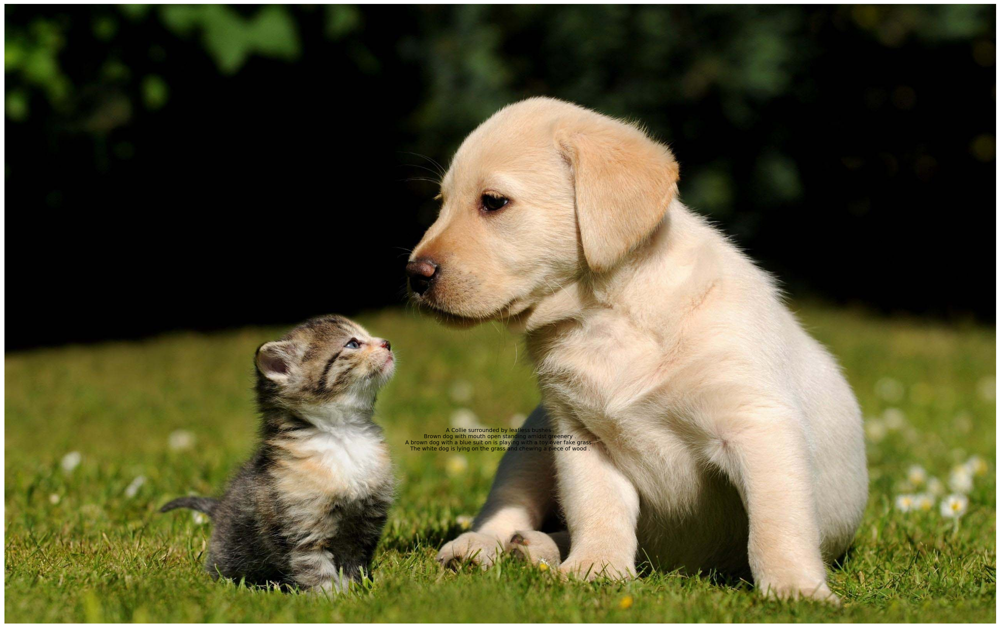

In [10]:
display_image_captions("assets/dog-cat.jpg", text_embeddings)

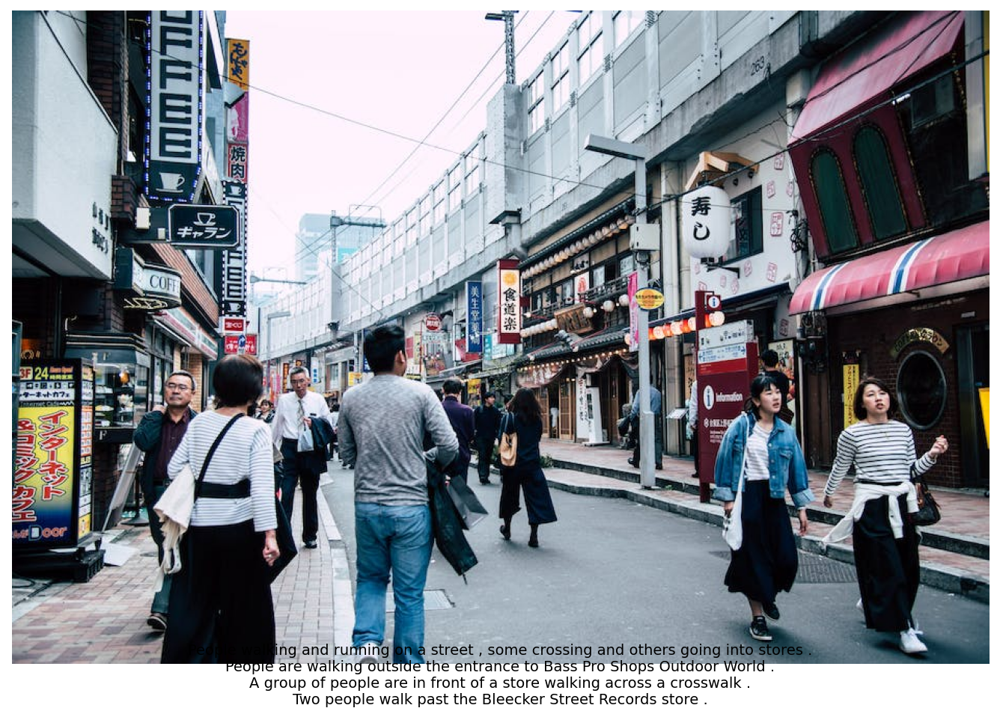

In [11]:
display_image_captions("assets/streets.jpeg", text_embeddings)

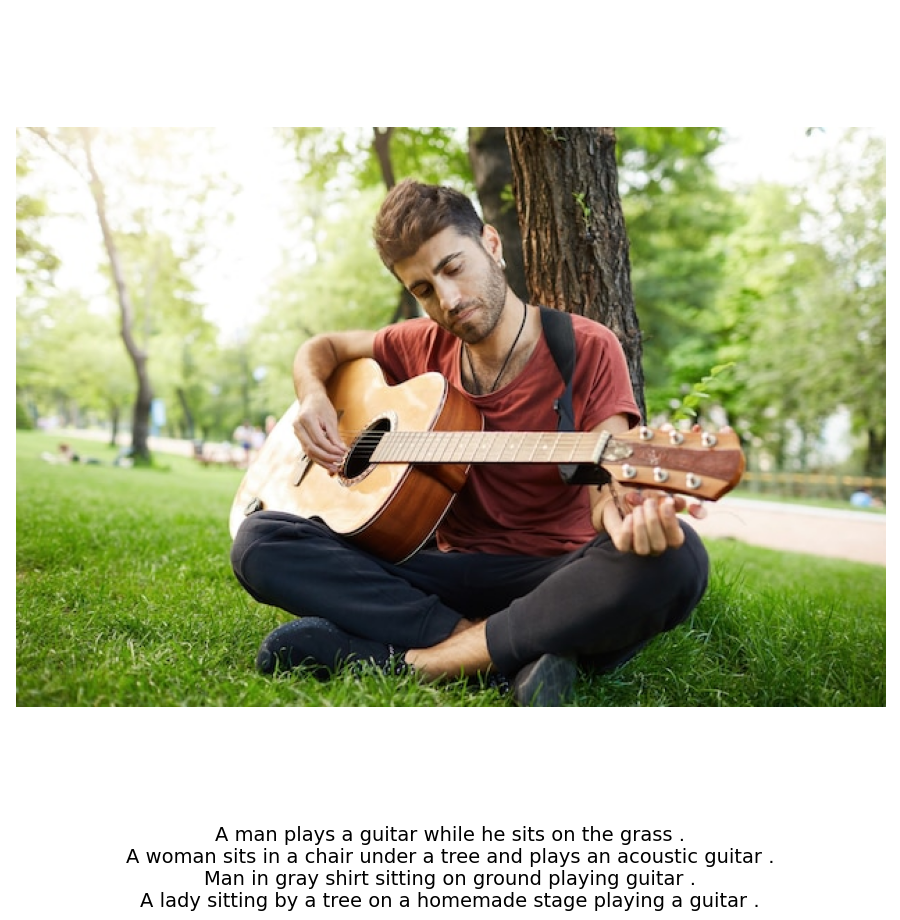

In [12]:
display_image_captions("assets/guitar.jpg", text_embeddings)

In [13]:
pytorch_total_params = sum(p.numel() for p in model.parameters())
print(f"Total Parameters of the model is {np.round(pytorch_total_params / 1e6, 1)} millions.")

Total Parameters of the model is 197.5 millions.
